<H1> Similarity of the Neighbourhoods in Toronto and New York for Emigration Purposes </H1>

<H2> Project Background </H2>

The aim of the project is to help people who are emigrating from Toronto to New York or vice versa to find similar neighbourhoods to where they currently live in terms of the venues nearby through visual aids. This will allow them to explore the different neighbourhhods and give them an idea of which neighbourhoods would be suitable for them to move to based on how similar they are to where they currently reside. It will also allow a general sense of how similar the two cities are and whether emigrating would be the right option for them. 

The project will utilise Unsupervised Machine Learning using K-Means clustering to cluster similar neighbourhoods in both Toronto and New York based on the venues in their proximity.

<H2> Data </H2>

The data to be used in the project consists of:
1) Toronto neighbourhood data including the Boroughs and Neighbourhoods from the following Wikipedia page: https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M

2) New York neighbourhood data including the Neighbourhoods and latitudes and longitudes from the following JSON file: https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json

3) Latitude and Longitude data from Geocoder or a CSV file to obtain the location data for each neighbourhood in Toronto

4) Foursquare data consisting of the nearby venues obtained using the Foursquare API with the latitude and longitude data

This data will be examined and explored using techniques such as visualisation before being preprocessed to convert it from it's raw form to a form which can be analysed. Any categorical variables will be encoded using One Hot Encoding. The data will be combined using the relevant criteria in order to allow the neighbourhoods to be compared and clustered based on their similarities in terms of venues. This will then be visualised to allow the analysis and learnings to be easily understood and evaluated to allow comparisons of neighbourhoods in both Toronto and New York. 

<H2> Methodology and Implementation </H2>

The first thing to do import the neccessary libraries required for the analysis.

In [1]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json # library to handle JSON files
!pip install geopy
!pip install geocoder 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import geopy
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
# import k-means from clustering stage
from sklearn.cluster import KMeans
!pip install folium
import folium # map rendering library

Now the New York and Toronto data needs to be gathered. The New York data is in the form of a JSON file on a server and the Toronto data is from a Wikipedia webpage. I will first download the New York data and preprocess it before dealing with the Toronto data.

In [2]:
#Getting the New York data from the server and opening it
!wget -q -O 'newyork_data.json' https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json
print('Data downloaded!')
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Data downloaded!


In [3]:
newyork_data

{'type': 'FeatureCollection',
 'totalFeatures': 306,
 'features': [{'type': 'Feature',
   'id': 'nyu_2451_34572.1',
   'geometry': {'type': 'Point',
    'coordinates': [-73.84720052054902, 40.89470517661]},
   'geometry_name': 'geom',
   'properties': {'name': 'Wakefield',
    'stacked': 1,
    'annoline1': 'Wakefield',
    'annoline2': None,
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.84720052054902,
     40.89470517661,
     -73.84720052054902,
     40.89470517661]}},
  {'type': 'Feature',
   'id': 'nyu_2451_34572.2',
   'geometry': {'type': 'Point',
    'coordinates': [-73.82993910812398, 40.87429419303012]},
   'geometry_name': 'geom',
   'properties': {'name': 'Co-op City',
    'stacked': 2,
    'annoline1': 'Co-op',
    'annoline2': 'City',
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.82993910812398,
     40.87429419303012,
     -73.82993910812398,
     40.87429419303012]}},
  {'type': 'Feature',
 

All the relevant data is in the features key, which is a list of the neighborhoods so I'll define a new variable that includes this data.

In [4]:
newyork_neighbourhoods_data = newyork_data['features']
newyork_neighbourhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

It can be seen that the data is in nested dictionaries so I will now transform this into a pandas dataframe as this will make it easier to analyse.

In [5]:
# define the dataframe columns
column_names = ['Location','Borough', 'Neighbourhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
newyork_neighbourhoods = pd.DataFrame(columns=column_names)

for data in newyork_neighbourhoods_data:
    borough = neighbourhood_name = data['properties']['borough'] 
    neighbourhood_name = data['properties']['name']
        
    neighbourhood_latlon = data['geometry']['coordinates']
    neighbourhood_lat = neighbourhood_latlon[1]
    neighbourhood_lon = neighbourhood_latlon[0]
    
    newyork_neighbourhoods = newyork_neighbourhoods.append({'Location':'New York',
                                          'Borough': borough,
                                          'Neighbourhood': neighbourhood_name,
                                          'Latitude': neighbourhood_lat,
                                          'Longitude': neighbourhood_lon}, ignore_index=True)

And now we can examine the new dataframe

In [6]:
newyork_neighbourhoods.head()

,Location,Borough,Neighbourhood,Latitude,Longitude
0,New York,Bronx,Wakefield,40.894705,-73.847201
1,New York,Bronx,Co-op City,40.874294,-73.829939
2,New York,Bronx,Eastchester,40.887556,-73.827806
3,New York,Bronx,Fieldston,40.895437,-73.905643
4,New York,Bronx,Riverdale,40.890834,-73.912585


In [7]:
print('The New York dataframe has {} boroughs and {} neighbourhoods.'.format(
        len(newyork_neighbourhoods['Borough'].unique()),
        newyork_neighbourhoods.shape[0]))

The New York dataframe has 5 boroughs and 306 neighbourhoods.


Geopy can be used to obtain the latitude and longitude of New York so it can be visualised.

In [8]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


With these coordinates, the map of New York can be rendered.

In [9]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighbourhood in zip(newyork_neighbourhoods['Latitude'], newyork_neighbourhoods['Longitude'], newyork_neighbourhoods['Borough'], newyork_neighbourhoods['Neighbourhood']):
    label = '{}, {}'.format(neighbourhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

Now that we have explored the New York data, we can import and explore the Toronto data. It needs to be scraped from the Wikipedia page using pandas.

In [10]:
#Scraping the Wikipedia webpage
# Webpage url                                                                                                               
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'

# Extract tables
dfs = pd.read_html(url)

# Get first table                                                                                                           
toronto_df = dfs[0]

# Extract columns                                                                                                           
toronto_df = toronto_df[['Postal Code','Borough', 'Neighbourhood']]

Now we can inspect the data to determine how it should preprocessed.

In [11]:
toronto_df.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


Removing any rows which have the Borough as 'Not assigned'.

In [12]:
#Drop values with 'Borough' set to 'Not Assigned'
toronto_df = toronto_df[toronto_df.Borough != 'Not assigned']
toronto_df = toronto_df.reset_index(drop=True)
toronto_df

,Postal Code,Borough,Neighbourhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"
5,M9A,Etobicoke,"Islington Avenue, Humber Valley Village"
6,M1B,Scarborough,"Malvern, Rouge"
7,M3B,North York,Don Mills
8,M4B,East York,"Parkview Hill, Woodbine Gardens"
9,M5B,Downtown Toronto,"Garden District, Ryerson"


In [13]:
#Checking size of dataframe after removing 'Not Assigned' Boroughs
print('The clean Toronto dataframe has {} rows and {} columns'.format(toronto_df.shape[0], toronto_df.shape[1]))

The clean Toronto dataframe has 103 rows and 3 columns


The table has now been scraped from the Wikipedia page and put into a dataframe where the rows which do not have values have been removed. The resulting dataframe has 103 rows and 3 columns. Now we can obtain the latitude and longitude values for the postal codes using the CSV file. 

In [14]:
latlong_df = pd.read_csv("https://cocl.us/Geospatial_data",)
latlong_df

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476
5,M1J,43.744734,-79.239476
6,M1K,43.727929,-79.262029
7,M1L,43.711112,-79.284577
8,M1M,43.716316,-79.239476
9,M1N,43.692657,-79.264848


Merging the existing dataframe with the new latitude and longitude dataframe using the Postal Code

In [15]:
toronto_df = pd.merge(toronto_df, latlong_df, on=['Postal Code'])
toronto_df

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494
5,M9A,Etobicoke,"Islington Avenue, Humber Valley Village",43.667856,-79.532242
6,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
7,M3B,North York,Don Mills,43.745906,-79.352188
8,M4B,East York,"Parkview Hill, Woodbine Gardens",43.706397,-79.309937
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937


Now to make the data matcth that of the New York data, I will drop the Postal Code column and add a location column.

In [16]:
toronto_df.drop(['Postal Code'], axis=1, inplace=True)
toronto_df.insert(0,'Location','Toronto')
toronto_df

,Location,Borough,Neighbourhood,Latitude,Longitude
0,Toronto,North York,Parkwoods,43.753259,-79.329656
1,Toronto,North York,Victoria Village,43.725882,-79.315572
2,Toronto,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,Toronto,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,Toronto,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494
5,Toronto,Etobicoke,"Islington Avenue, Humber Valley Village",43.667856,-79.532242
6,Toronto,Scarborough,"Malvern, Rouge",43.806686,-79.194353
7,Toronto,North York,Don Mills,43.745906,-79.352188
8,Toronto,East York,"Parkview Hill, Woodbine Gardens",43.706397,-79.309937
9,Toronto,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937


Now we can visualise Toronto and the neighbourhoods on the map

In [17]:
map_toronto = folium.Map(location=[43.65, -79.35], zoom_start=11)

# add markers to map
for lat, lng, borough, neighbourhood in zip(toronto_df['Latitude'], toronto_df['Longitude'], toronto_df['Borough'], toronto_df['Neighbourhood']):
    label = '{}, {}'.format(neighbourhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

Now that both datasets have been explored and preprocessed, the dataframes can be combined ready for use by the the Foursquare API.

In [18]:
neighbourhoods_df = pd.concat([newyork_neighbourhoods, toronto_df], ignore_index=True)
neighbourhoods_df

,Location,Borough,Neighbourhood,Latitude,Longitude
0,New York,Bronx,Wakefield,40.894705,-73.847201
1,New York,Bronx,Co-op City,40.874294,-73.829939
2,New York,Bronx,Eastchester,40.887556,-73.827806
3,New York,Bronx,Fieldston,40.895437,-73.905643
4,New York,Bronx,Riverdale,40.890834,-73.912585
5,New York,Bronx,Kingsbridge,40.881687,-73.902818
6,New York,Manhattan,Marble Hill,40.876551,-73.910660
7,New York,Bronx,Woodlawn,40.898273,-73.867315
8,New York,Bronx,Norwood,40.877224,-73.879391
9,New York,Bronx,Williamsbridge,40.881039,-73.857446


 Now the Foursquare API can be used to obtain some venue data for the neighbourhoods. I will start by defining the credentials required.

In [19]:
CLIENT_ID = 'PS30OIFCO4PKJ511UATPOCUEISVU4TT5AXA3RPQFEB20OHBN' # Foursquare ID
CLIENT_SECRET = 'KXJRPQVWZQRXPNRFIGKU1Z1YGGOMNK5WXKFSK4IDBUK3G2P4' # Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Credentials:
CLIENT_ID: PS30OIFCO4PKJ511UATPOCUEISVU4TT5AXA3RPQFEB20OHBN
CLIENT_SECRET:KXJRPQVWZQRXPNRFIGKU1Z1YGGOMNK5WXKFSK4IDBUK3G2P4


A function can be defined to get the venues nearby to each neighbourhood using the Foursquare API.

In [20]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Now I will define a function which can be used to extract the category of venues obtained from the Foursquare API.

In [21]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

The getNearbyVenues function can be used with the dataframe.

In [24]:
venues = getNearbyVenues(names=neighbourhoods_df['Neighbourhood'],
                                   latitudes=neighbourhoods_df['Latitude'],
                                   longitudes=neighbourhoods_df['Longitude']
                                  )
print(venues.shape)
venues.head()

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


Now we can check how many venues were returned for each neighbourhood.

In [25]:
venues.groupby('Neighbourhood').count()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Agincourt,3,3,3,3,3,3
"Alderwood, Long Branch",9,9,9,9,9,9
Allerton,31,31,31,31,31,31
Annadale,10,10,10,10,10,10
Arden Heights,5,5,5,5,5,5
Arlington,6,6,6,6,6,6
Arrochar,21,21,21,21,21,21
Arverne,19,19,19,19,19,19
Astoria,100,100,100,100,100,100


In [26]:
print('There are {} uniques categories.'.format(len(venues['Venue Category'].unique())))

There are 465 uniques categories.


Now we can plot a graph to show the most frequently occurring venue categories.

In [45]:
# Get top 10 most frequent vanue categories
venues_cat = venues.groupby('Venue Category').count()
venues_cat.sort_values(by='Venue', ascending=True, inplace=True)
venues_cat.drop(venues_cat.columns[[0,1,2,4,5]], axis=1, inplace = True)
venues_cat = venues_cat.tail(10)

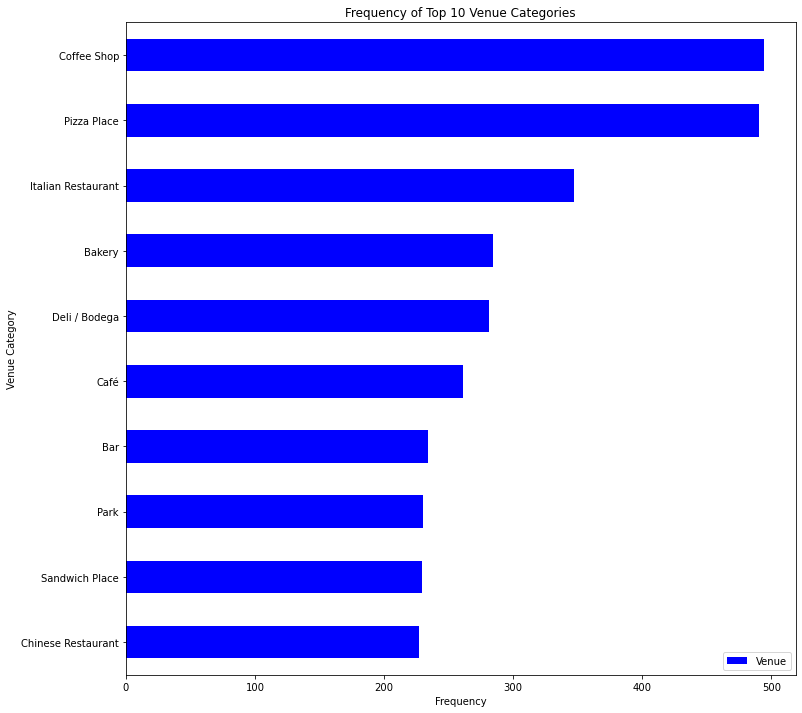

In [46]:
# Generate plot of highest frequency of venue category
import matplotlib as mpl
import matplotlib.pyplot as plt

venues_cat.plot(kind='barh', figsize=(12, 12), color='blue')
plt.xlabel('Frequency')
plt.ylabel('Venue Category')
plt.title('Frequency of Top 10 Venue Categories')

plt.show()

Now One Hot Encoding has to be used in order to allow the K-Means Algorithm to be used as categorical variables cannot be used.

In [47]:
# one hot encoding
df_onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
df_onehot['Neighbourhood'] = venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [df_onehot.columns[-1]] + list(df_onehot.columns[:-1])
df_onehot = df_onehot[fixed_columns]

df_onehot.head()

,Neighbourhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Christmas Market,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Midd

The new dataframe size can be observed.

In [48]:
df_onehot.shape

(12178, 466)

The rows can be grouped by neighbourhood with the mean frequency of occurence of each category

In [49]:
neighbourhoods_grouped = df_onehot.groupby('Neighbourhood').mean().reset_index()
neighbourhoods_grouped

,Neighbourhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Christmas Market,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Midd

The top 5 venues for each neighbourhood can be printed to explore the results

In [50]:
num_top_venues = 5

for hood in neighbourhoods_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = neighbourhoods_grouped[neighbourhoods_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
                       venue  freq
0  Latin American Restaurant  0.33
1             Breakfast Spot  0.33
2                     Lounge  0.33
3                Outdoor Gym  0.00
4         Persian Restaurant  0.00


----Alderwood, Long Branch----
                venue  freq
0         Pizza Place  0.22
1        Skating Rink  0.11
2                 Pub  0.11
3      Sandwich Place  0.11
4  Athletics & Sports  0.11


----Allerton----
                venue  freq
0         Pizza Place  0.16
1       Deli / Bodega  0.10
2         Supermarket  0.06
3         Bus Station  0.06
4  Chinese Restaurant  0.06


----Annadale----
              venue  freq
0       Pizza Place   0.2
1  Sushi Restaurant   0.1
2     Train Station   0.1
3             Diner   0.1
4              Food   0.1


----Arden Heights----
           venue  freq
0       Pharmacy   0.2
1  Deli / Bodega   0.2
2    Coffee Shop   0.2
3    Pizza Place   0.2
4         Lawyer   0.2


----Arlington----
           venue  freq
0  B

                venue  freq
0       Deli / Bodega  0.05
1         Yoga Studio  0.04
2         Pizza Place  0.04
3      Cosmetics Shop  0.04
4  Italian Restaurant  0.04


----Brookville----
                venue  freq
0        Home Service  0.67
1       Deli / Bodega  0.33
2                 ATM  0.00
3         Outdoor Gym  0.00
4  Persian Restaurant  0.00


----Brownsville----
                 venue  freq
0        Moving Target  0.12
1   Chinese Restaurant  0.12
2  Fried Chicken Joint  0.12
3          Pizza Place  0.06
4                Trail  0.06


----Bulls Head----
                venue  freq
0         Pizza Place  0.09
1            Bus Stop  0.09
2       Deli / Bodega  0.05
3      Sandwich Place  0.05
4  Chinese Restaurant  0.05


----Bushwick----
                    venue  freq
0                     Bar  0.10
1           Deli / Bodega  0.07
2      Mexican Restaurant  0.07
3             Coffee Shop  0.06
4  Thrift / Vintage Store  0.04


----Business reply mail Processing Centre, So

                venue  freq
0      Sandwich Place  0.33
1                 Spa  0.17
2  Athletics & Sports  0.17
3            Bus Stop  0.17
4          Playground  0.17


----Crown Heights----
           venue  freq
0    Pizza Place  0.13
1         Museum  0.09
2           Café  0.09
3         Bakery  0.09
4  Deli / Bodega  0.04


----Cypress Hills----
                  venue  freq
0   Fried Chicken Joint  0.11
1            Donut Shop  0.07
2  Fast Food Restaurant  0.07
3           Pizza Place  0.07
4        Ice Cream Shop  0.07


----Davisville----
            venue  freq
0    Dessert Shop  0.09
1  Sandwich Place  0.09
2     Pizza Place  0.09
3            Café  0.06
4             Gym  0.06


----Davisville North----
              venue  freq
0  Department Store  0.12
1    Breakfast Spot  0.12
2              Park  0.12
3             Hotel  0.12
4    Sandwich Place  0.12


----Del Ray, Mount Dennis, Keelsdale and Silverthorn----
                venue  freq
0  Turkish Restaurant   0.2
1  

           venue  freq
0     Food Truck  0.25
1       Wine Bar  0.25
2  Boat or Ferry  0.25
3  Grocery Store  0.25
4            ATM  0.00


----Grant City----
                    venue  freq
0             Pizza Place  0.12
1    Fast Food Restaurant  0.08
2               Juice Bar  0.04
3  Furniture / Home Store  0.04
4       French Restaurant  0.04


----Grasmere----
            venue  freq
0        Bus Stop  0.19
1            Food  0.11
2      Bagel Shop  0.07
3      Nail Salon  0.04
4  Ice Cream Shop  0.04


----Gravesend----
                venue  freq
0         Pizza Place  0.14
1              Lounge  0.10
2              Bakery  0.10
3  Chinese Restaurant  0.10
4            Pharmacy  0.05


----Great Kills----
                venue  freq
0                 Bar  0.14
1  Italian Restaurant  0.14
2         Pizza Place  0.09
3        Liquor Store  0.05
4  Spanish Restaurant  0.05


----Greenpoint----
           venue  freq
0    Pizza Place  0.07
1            Bar  0.06
2    Coffee Shop  

----Kingsview Village, St. Phillips, Martin Grove Gardens, Richview Gardens----
               venue  freq
0  Mobile Phone Shop  0.25
1               Park  0.25
2           Bus Line  0.25
3     Sandwich Place  0.25
4  Other Repair Shop  0.00


----Laurelton----
                  venue  freq
0  Caribbean Restaurant  0.50
1        Cosmetics Shop  0.17
2         Train Station  0.17
3                  Park  0.17
4              Pet Café  0.00


----Lawrence Manor, Lawrence Heights----
                    venue  freq
0          Clothing Store  0.33
1  Furniture / Home Store  0.17
2       Accessories Store  0.08
3      Miscellaneous Shop  0.08
4             Event Space  0.08


----Lawrence Park----
               venue  freq
0   Business Service  0.25
1               Park  0.25
2        Swim School  0.25
3           Bus Line  0.25
4  Other Repair Shop  0.00


----Leaside----
                    venue  freq
0     Sporting Goods Shop  0.09
1             Coffee Shop  0.09
2  Furniture / Home Sto

                  venue  freq
0        Discount Store  0.16
1         Grocery Store  0.08
2  Fast Food Restaurant  0.08
3            Donut Shop  0.08
4           Pizza Place  0.08


----Mott Haven----
                venue  freq
0          Donut Shop  0.11
1         Pizza Place  0.11
2                 Gym  0.11
3  Spanish Restaurant  0.11
4              Bakery  0.06


----Mount Eden----
                 venue  freq
0             Pharmacy  0.09
1        Deli / Bodega  0.06
2  Fried Chicken Joint  0.06
3   Spanish Restaurant  0.06
4        Grocery Store  0.06


----Mount Hope----
            venue  freq
0   Grocery Store  0.12
1     Pizza Place  0.06
2       BBQ Joint  0.06
3    Liquor Store  0.06
4  Sandwich Place  0.06


----Murray Hill----
                 venue  freq
0    Korean Restaurant  0.16
1          Coffee Shop  0.05
2                  Bar  0.04
3  Japanese Restaurant  0.03
4       Sandwich Place  0.03


----Neponsit----
                   venue  freq
0                  Beach 

----Prince's Bay----
                venue  freq
0         Pizza Place  0.18
1            Pharmacy  0.09
2  Chinese Restaurant  0.09
3    Business Service  0.09
4        Liquor Store  0.09


----Prospect Heights----
                venue  freq
0                 Bar  0.09
1  Mexican Restaurant  0.08
2         Coffee Shop  0.04
3              Bakery  0.04
4     Thai Restaurant  0.04


----Prospect Lefferts Gardens----
                  venue  freq
0                  Café  0.09
1                Bakery  0.07
2  Caribbean Restaurant  0.07
3           Pizza Place  0.07
4     Indian Restaurant  0.04


----Prospect Park South----
                  venue  freq
0  Caribbean Restaurant  0.08
1           Pizza Place  0.06
2     Mobile Phone Shop  0.06
3  Fast Food Restaurant  0.06
4         Grocery Store  0.06


----Queen's Park, Ontario Provincial Government----
                venue  freq
0         Coffee Shop  0.22
1    Sushi Restaurant  0.06
2         Yoga Studio  0.03
3       Smoothie Shop  0

                  venue  freq
0  Caribbean Restaurant  0.22
1           Bus Station  0.22
2                Bakery  0.11
3        Sandwich Place  0.11
4         Grocery Store  0.11


----South Ozone Park----
           venue  freq
0           Park  0.23
1            Bar  0.15
2  Deli / Bodega  0.15
3          Hotel  0.08
4     Donut Shop  0.08


----South Side----
                 venue  freq
0          Pizza Place  0.07
1                  Bar  0.06
2          Coffee Shop  0.06
3             Wine Bar  0.04
4  American Restaurant  0.04


----South Steeles, Silverstone, Humbergate, Jamestown, Mount Olive, Beaumond Heights, Thistletown, Albion Gardens----
                  venue  freq
0         Grocery Store  0.25
1   Fried Chicken Joint  0.12
2  Fast Food Restaurant  0.12
3              Pharmacy  0.12
4        Sandwich Place  0.12


----Springfield Gardens----
                  venue  freq
0           Bus Station  0.12
1            Donut Shop  0.12
2           Gas Station  0.06
3  Fast Fo

                  venue  freq
0              Pharmacy  0.22
1        Ice Cream Shop  0.11
2            Laundromat  0.11
3        Sandwich Place  0.11
4  Caribbean Restaurant  0.11


----Washington Heights----
               venue  freq
0               Café  0.07
1             Bakery  0.05
2               Bank  0.04
3  Mobile Phone Shop  0.04
4               Park  0.02


----Weeksville----
                venue  freq
0  Chinese Restaurant  0.08
1        Cocktail Bar  0.08
2              Lounge  0.08
3       Grocery Store  0.08
4      History Museum  0.08


----West Brighton----
            venue  freq
0     Coffee Shop  0.08
1            Bank  0.06
2             Bar  0.06
3        Pharmacy  0.06
4  Breakfast Spot  0.06


----West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale----
                   venue  freq
0                 Bakery   1.0
1                    ATM   0.0
2      Other Repair Shop   0.0
3  Performing Arts Venue   0.0
4       Pedestrian Plaza   0.0


---

Now we can write a function to sort the venues in descending order.

In [51]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Creating a new dataframe to display the the top 10 venues for each neighbourhood.

In [52]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhood'] = neighbourhoods_grouped['Neighbourhood']

for ind in np.arange(neighbourhoods_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(neighbourhoods_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Breakfast Spot,Lounge,Latin American Restaurant,Eastern European Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
1,"Alderwood, Long Branch",Pizza Place,Coffee Shop,Sandwich Place,Pub,Gym,Pool,Skating Rink,Athletics & Sports,Event Space,Event Service
2,Allerton,Pizza Place,Deli / Bodega,Chinese Restaurant,Bus Station,Supermarket,Spa,Fast Food Restaurant,Donut Shop,Smoke Shop,Gas Station
3,Annadale,Pizza Place,Bakery,Dance Studio,Diner,Pharmacy,Train Station,Restaurant,Sushi Restaurant,Food,Ethiopian Restaurant
4,Arden Heights,Deli / Bodega,Pizza Place,Coffee Shop,Lawyer,Pharmacy,Yoga Studio,Eye Doctor,Exhibit,Event Space,Event Service


Now we can use the K-Means Clustering algorithm to cluster the neighbourhoods based on their similarity. The number of clusters has been optimised by running the algorithms multiple times and comparing the results.

In [53]:
# set number of clusters
kclusters = 4

neighbourhoods_grouped_clustering = neighbourhoods_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(neighbourhoods_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3], dtype=int32)

I will now create a new dataframe that includes the cluster as well as the top 10 venues for each neighbourhood.

In [54]:
# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

neighbourhoods_merged = neighbourhoods_df

# merge neighbourhoods_grouped with neighbourhoods_df to add latitude/longitude for each neighbourhood
neighbourhoods_merged = neighbourhoods_merged.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')

neighbourhoods_merged.head()

,Location,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,New York,Bronx,Wakefield,40.894705,-73.847201,3.0,Pharmacy,Laundromat,Caribbean Restaurant,Ice Cream Shop,Dessert Shop,Donut Shop,Sandwich Place,Deli / Bodega,Event Service,Eye Doctor
1,New York,Bronx,Co-op City,40.874294,-73.829939,3.0,Bus Station,Discount Store,Pharmacy,Salon / Barbershop,Grocery Store,Restaurant,Pizza Place,Fast Food Restaurant,Basketball Court,Park
2,New York,Bronx,Eastchester,40.887556,-73.827806,3.0,Caribbean Restaurant,Bus Stop,Bus Station,Diner,Deli / Bodega,Donut Shop,Metro Station,Fast Food Restaurant,Automotive Shop,Pizza Place
3,New York,Bronx,Fieldston,40.895437,-73.905643,3.0,Music Venue,Plaza,River,Bus Station,Food & Drink Shop,Food,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room
4,New York,Bronx,Riverdale,40.890834,-73.912585,1.0,Park,Plaza,Food Truck,Bank,Gym,Home Service,Medical Supply Store,Bus Station,Yoga Studio,Exhibit


Remove any rows which were not clustered and convert the 'Cluster Labels' values to integers

In [55]:
neighbourhoods_merged = neighbourhoods_merged[neighbourhoods_merged['Cluster Labels'].notna()]
neighbourhoods_merged = neighbourhoods_merged.astype({"Cluster Labels": int})
neighbourhoods_merged

,Location,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,New York,Bronx,Wakefield,40.894705,-73.847201,3,Pharmacy,Laundromat,Caribbean Restaurant,Ice Cream Shop,Dessert Shop,Donut Shop,Sandwich Place,Deli / Bodega,Event Service,Eye Doctor
1,New York,Bronx,Co-op City,40.874294,-73.829939,3,Bus Station,Discount Store,Pharmacy,Salon / Barbershop,Grocery Store,Restaurant,Pizza Place,Fast Food Restaurant,Basketball Court,Park
2,New York,Bronx,Eastchester,40.887556,-73.827806,3,Caribbean Restaurant,Bus Stop,Bus Station,Diner,Deli / Bodega,Donut Shop,Metro Station,Fast Food Restaurant,Automotive Shop,Pizza Place
3,New York,Bronx,Fieldston,40.895437,-73.905643,3,Music Venue,Plaza,River,Bus Station,Food & Drink Shop,Food,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room
4,New York,Bronx,Riverdale,40.890834,-73.912585,1,Park,Plaza,Food Truck,Bank,Gym,Home Service,Medical Supply Store,Bus Station,Yoga Studio,Exhibit
5,New York,Bronx,Kingsbridge,40.881687,-73.902818,3,Pizza Place,Bar,Latin American Restaurant,Sandwich Place,Mexican Restaurant,Pharmacy,Supermarket,Fried Chicken Joint,Liquor Store,Bakery
6,New York,Manhattan,Marble Hill,40.876551,-73.910660,3,Gym,Discount Store,Sandwich Place,Coffee Shop,Yoga Studio,Deli / Bodega,Steakhouse,Shopping Mall,Seafood Restaurant,Pizza Place
7,New York,Bronx,Woodlawn,40.898273,-73.867315,3,Pizza Place,Pub,Bar,Playground,Deli / Bodega,Convenience Store,Rental Car Location,Cosmetics Shop,Donut Shop,Train Station
8,New York,Bronx,Norwood,40.877224,-73.879391,3,Pizza Place,Park,Bank,Chinese Restaurant,Bus Station,Pharmacy,Caribbean Restaurant,Coffee Shop,Sandwich Place,Grocery Store
9,New York,Bronx,Williamsbridge,40.881039,-73.857446,3,Caribbean Restaurant,Nightclub,Bar,Soup Place,Yoga Studio,Falafel Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant


Now the clusters can be visualised on the map.

In [56]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(neighbourhoods_merged['Latitude'], neighbourhoods_merged['Longitude'], neighbourhoods_merged['Neighbourhood'], neighbourhoods_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

Now we can list the neighbourhoods which were clustered together.

Cluster 1

In [57]:
neighbourhoods_merged.loc[neighbourhoods_merged['Cluster Labels'] == 0, neighbourhoods_merged.columns[[0,1,2] + list(range(5, neighbourhoods_merged.shape[1]))]]

,Location,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
303,New York,Queens,Bayswater,0,Playground,Yoga Studio,Farmers Market,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
338,Toronto,Scarborough,Scarborough Village,0,Pizza Place,Playground,Yoga Studio,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
389,Toronto,Central Toronto,"Moore Park, Summerhill East",0,Summer Camp,Tennis Court,Playground,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant


Cluster 2

In [58]:
neighbourhoods_merged.loc[neighbourhoods_merged['Cluster Labels'] == 1, neighbourhoods_merged.columns[[0,1,2] + list(range(5, neighbourhoods_merged.shape[1]))]]

,Location,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,New York,Bronx,Riverdale,1,Park,Plaza,Food Truck,Bank,Gym,Home Service,Medical Supply Store,Bus Station,Yoga Studio,Exhibit
27,New York,Bronx,Clason Point,1,Park,Convenience Store,Boat or Ferry,Grocery Store,South American Restaurant,Pool,Bus Stop,Recording Studio,Fish Market,Electronics Store
35,New York,Bronx,Spuyten Duyvil,1,Park,Bank,Grocery Store,Scenic Lookout,Thai Restaurant,Tennis Stadium,Asian Restaurant,Pharmacy,Eastern European Restaurant,Empanada Restaurant
91,New York,Brooklyn,Bergen Beach,1,Harbor / Marina,Park,Baseball Field,Athletics & Sports,Playground,Falafel Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room
148,New York,Queens,South Ozone Park,1,Park,Bar,Deli / Bodega,Food Truck,Food,Sandwich Place,Donut Shop,Fast Food Restaurant,Hotel,Ethiopian Restaurant
163,New York,Queens,Hollis,1,Park,Baseball Field,Shopping Mall,Mobile Phone Shop,Bakery,Sandwich Place,Asian Restaurant,Electronics Store,Discount Store,Lounge
198,New York,Staten Island,New Brighton,1,Bus Stop,Deli / Bodega,Park,Bowling Alley,Playground,Discount Store,Event Service,Event Space,Ethiopian Restaurant,Escape Room
224,New York,Staten Island,Park Hill,1,Bus Stop,Park,Gym / Fitness Center,Athletics & Sports,Coffee Shop,Hotel,Yoga Studio,Factory,English Restaurant,Entertainment Service
238,New York,Staten Island,Butler Manor,1,Baseball Field,Pool,Bus Stop,Gas Station,Farmers Market,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
275,New York,Manhattan,Stuyvesant Town,1,Park,Bar,Coffee Shop,Farmers Market,German Restaurant,Heliport,Gas Station,Playground,Pet Service,Harbor / Marina


Cluster 3

In [59]:
neighbourhoods_merged.loc[neighbourhoods_merged['Cluster Labels'] == 2, neighbourhoods_merged.columns[[0,1,2] + list(range(5, neighbourhoods_merged.shape[1]))]]

,Location,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
192,New York,Queens,Somerville,2,Park,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
203,New York,Staten Island,Todt Hill,2,Park,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
327,Toronto,York,Caledonia-Fairbanks,2,Park,Women's Store,Pool,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant
341,Toronto,East York,"East Toronto, Broadview North (Old East York)",2,Park,Convenience Store,Metro Station,Yoga Studio,Falafel Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant
358,Toronto,North York,"Willowdale, Newtonbrook",2,Park,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
370,Toronto,York,Weston,2,Park,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
372,Toronto,North York,York Mills West,2,Park,Convenience Store,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service


Cluster 4

In [60]:
neighbourhoods_merged.loc[neighbourhoods_merged['Cluster Labels'] == 3, neighbourhoods_merged.columns[[0,1,2] + list(range(5, neighbourhoods_merged.shape[1]))]]

,Location,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,New York,Bronx,Wakefield,3,Pharmacy,Laundromat,Caribbean Restaurant,Ice Cream Shop,Dessert Shop,Donut Shop,Sandwich Place,Deli / Bodega,Event Service,Eye Doctor
1,New York,Bronx,Co-op City,3,Bus Station,Discount Store,Pharmacy,Salon / Barbershop,Grocery Store,Restaurant,Pizza Place,Fast Food Restaurant,Basketball Court,Park
2,New York,Bronx,Eastchester,3,Caribbean Restaurant,Bus Stop,Bus Station,Diner,Deli / Bodega,Donut Shop,Metro Station,Fast Food Restaurant,Automotive Shop,Pizza Place
3,New York,Bronx,Fieldston,3,Music Venue,Plaza,River,Bus Station,Food & Drink Shop,Food,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room
5,New York,Bronx,Kingsbridge,3,Pizza Place,Bar,Latin American Restaurant,Sandwich Place,Mexican Restaurant,Pharmacy,Supermarket,Fried Chicken Joint,Liquor Store,Bakery
6,New York,Manhattan,Marble Hill,3,Gym,Discount Store,Sandwich Place,Coffee Shop,Yoga Studio,Deli / Bodega,Steakhouse,Shopping Mall,Seafood Restaurant,Pizza Place
7,New York,Bronx,Woodlawn,3,Pizza Place,Pub,Bar,Playground,Deli / Bodega,Convenience Store,Rental Car Location,Cosmetics Shop,Donut Shop,Train Station
8,New York,Bronx,Norwood,3,Pizza Place,Park,Bank,Chinese Restaurant,Bus Station,Pharmacy,Caribbean Restaurant,Coffee Shop,Sandwich Place,Grocery Store
9,New York,Bronx,Williamsbridge,3,Caribbean Restaurant,Nightclub,Bar,Soup Place,Yoga Studio,Falafel Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant
10,New York,Bronx,Baychester,3,Discount Store,Donut Shop,Convenience Store,Gym / Fitness Center,Pizza Place,Pet Store,Sandwich Place,Electronics Store,Fast Food Restaurant,Spanish Restaurant


<H2> Results </H2>

Below is a function to display the neighbourhoods in Toronto which are in the same cluster as the entered New York neighbourhood or vice versa for the user to find out which neighbourhoods are similar to the neighbourhood they curently reside in.

In [61]:
def similar_neighbourhood_table():
    running = True
    while running == True:
        hood = input('Please enter the neighbourhood:')
        hood = hood.lower()
        df = neighbourhoods_merged[neighbourhoods_merged.Neighbourhood.str.lower() == hood]
        if len(df) != 0:
            running = False 
        else:
            print('Sorry that neighbourhood is not listed, please enter another neighbourhood')
    cluster = df.iloc[0]['Cluster Labels']
    location = df.iloc[0]['Location']
    if location == 'New York':
        location = 'Toronto'
    elif location == 'Toronto':
        location = 'New York'
    results = neighbourhoods_merged[(neighbourhoods_merged['Location'] == location) & (neighbourhoods_merged['Cluster Labels'] == cluster)]
    return results

similar_neighbourhood_table()

Please enter the neighbourhood:riverdale


,Location,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
306,Toronto,North York,Parkwoods,43.753259,-79.329656,1,Construction & Landscaping,Park,Food & Drink Shop,Yoga Studio,Falafel Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant
320,Toronto,East York,Woodbine Heights,43.695344,-79.318389,1,Bus Stop,Video Store,Skating Rink,Athletics & Sports,Beer Store,Park,Curling Ice,Food,Factory,English Restaurant
346,Toronto,North York,Downsview,43.737473,-79.464763,1,Grocery Store,Park,Shopping Mall,Discount Store,Coffee Shop,Athletics & Sports,Bus Stop,Bank,Airport,Baseball Field
352,Toronto,North York,Downsview,43.739015,-79.506944,1,Grocery Store,Park,Shopping Mall,Discount Store,Coffee Shop,Athletics & Sports,Bus Stop,Bank,Airport,Baseball Field
355,Toronto,North York,"North Park, Maple Leaf Park, Upwood Park",43.713756,-79.490074,1,Park,Construction & Landscaping,Bakery,Trail,Basketball Court,Falafel Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room
359,Toronto,North York,Downsview,43.728496,-79.495697,1,Grocery Store,Park,Shopping Mall,Discount Store,Coffee Shop,Athletics & Sports,Bus Stop,Bank,Airport,Baseball Field
363,Toronto,North York,"Humberlea, Emery",43.724766,-79.532242,1,Baseball Field,Yoga Studio,Farm,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
366,Toronto,North York,Downsview,43.761631,-79.520999,1,Grocery Store,Park,Shopping Mall,Discount Store,Coffee Shop,Athletics & Sports,Bus Stop,Bank,Airport,Baseball Field
367,Toronto,Central Toronto,Lawrence Park,43.728020,-79.388790,1,Park,Business Service,Swim School,Bus Line,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
374,Toronto,Central Toronto,"Forest Hill North & West, Forest Hill Road Park",43.696948,-79.411307,1,Park,Trail,Jewelry Store,Sushi Restaurant,Yoga Studio,Factory,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service


Using this function, the user can enter a neighbourhood in either New York or Toronto and retrieve a table of all of the similar neighbourhoods in the other location which they can then look through to determine which neighbourhoods they like.

Now I will define a similar function which will plot the neighbourhoods on the map so the user can get a visual representation.

In [62]:
def similar_neighbourhood_map():
    running = True
    while running == True:
        hood = input('Please enter the neighbourhood:')
        hood = hood.lower()
        df = neighbourhoods_merged[neighbourhoods_merged.Neighbourhood.str.lower() == hood]
        if len(df) != 0:
            running = False 
        else:
            print('Sorry that neighbourhood is not listed, please enter another neighbourhood')
    cluster = df.iloc[0]['Cluster Labels']
    location = df.iloc[0]['Location']
    if location == 'New York':
        location = 'Toronto'
        latitude = 43.65
        longitude = -79.38
    elif location == 'Toronto':
        location = 'New York'
        latitude = 40.71
        longitude = -74.00
    results = neighbourhoods_merged[(neighbourhoods_merged['Location'] == location) & (neighbourhoods_merged['Cluster Labels'] == cluster)]
    
    map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)
    for lat, lon, poi, cluster in zip(results['Latitude'], results['Longitude'], results['Neighbourhood'], results['Cluster Labels']):
        label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster-1],
            fill=True,
            fill_color=rainbow[cluster-1],
            fill_opacity=0.7).add_to(map_clusters)
       
    return map_clusters

similar_neighbourhood_map()

Please enter the neighbourhood:riverdale


Using this function, the user can enter a neighbourhood in either New York or Toronto and view a map of all of the similar neighbourhoods in the other location which they can then explore to determine which neighbourhoods they like. The algorithm was able to cluster similar neighbourhoods into the following broad categories:

Cluster 1 - Restaurants and Convenience Stores

Cluster 2 - Fitness and Nature

Cluster 3 - Attractions and Landmarks

Cluster 4 - Sports and Entertainment

<H2> Discussion </H2>

I have implemented Unsupervised Machine Learning in the form of K-Means Clustering in order to group neighbourhoods across New York and Toronto according to their similarity in terms of venues nearby. I optmised the number of clusters by running the algorithm multiple times with differing numbers of clusters and observing the results before arriving at 4 clusters being a reasonable number. The data was visualised and explored before implementing the algorithm to ensure that it was suitable. This led to the preprocessing and refinement of the data to ensure the data could be utilised and any redundant or erroneous data was removed. 

The clustering of the neighbourhoods into the 4 categories gives anyone thinking about emigrating between New York and Toronto an idea of which neighbourhoods may be suitable to explore further.

The algorithm can be further enhanced by providing additional data such as the average property prices and average income as well as the crime statistics of the neighbourhoods, which would allow for enhanced analysis and comparisons. This may lead to an increased number of clusters which would give the user an even better understanding of the neighbourhoods to explore further and assist in narrowing down the search for a suitable area.

<H2> Conclusion </H2>

In conclusion, the data was successfully imported, preprocessed and K-Means Clustering implemented to cluster the neighbourhoods into 4 categories. Although the clustering was successful, there is scope for improvement and further analysis possibly using even more data such as financial data to help the user make an informed decision as to which neighbourhood to relocate to. Nevertheless, the analysis provides an adequate starting point for anybody interested in emigrating between New York and Toronto and allows the exploration and visualisation of the data in a quick and easy manner.